In [291]:
import cv2
import pandas as pd
import numpy as np
import os
import math
import json

from pdf2image import convert_from_path
from PIL import Image
from matplotlib import pyplot as plt

In [383]:
#### 최신버전
def convert_pdf_folder_to_images(pdf_folder, output_folder, chk = False):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    for filename in os.listdir(pdf_folder):
        if filename.endswith('.pdf'):
            print(filename)
            pdf_path = os.path.join(pdf_folder, filename)
            images = convert_from_path(pdf_path)
            base_filename = os.path.splitext(filename)[0]
            
            for page_num, img in enumerate(images):
                if page_num == 0:
                    left_num = len(images)*2
                    right_num = 1
                else:
                    left_num = right_num + 1
                    right_num = left_num + 1
                    
                output_path = os.path.join(output_folder, f"{base_filename}_page_{page_num + 1}.jpg")
                img.save(output_path, 'JPEG')
                
                if chk:
                    width, height = img.size
                    print(width, height)
                    # width -= 20
                    # height -= 20
                    # left_half = img.crop((20, 20, width // 2, height))
                    # right_half = img.crop((width // 2, 20, width, height))
                    crop_size = 30
                    left_half = img.crop((crop_size, crop_size, int((width/2)-crop_size), height-crop_size))
                    right_half = img.crop((int((width/2)+crop_size), crop_size, width-crop_size, height-crop_size))
                else:
                    width, height = img.size
                    left_half = img.crop((0, 0, width // 2, height))
                    right_half = img.crop((width // 2, 0, width, height))
                    
                # left_half_path = os.path.join(output_folder, f"{base_filename}_page_{page_num + 1}_left.jpg")
                # right_half_path = os.path.join(output_folder, f"{base_filename}_page_{page_num + 1}_right.jpg")
                left_half_path = os.path.join(output_folder, f"{base_filename}_{left_num}.jpg")
                right_half_path = os.path.join(output_folder, f"{base_filename}_{right_num}.jpg")
                
                left_half.save(left_half_path, 'JPEG')
                right_half.save(right_half_path, 'JPEG')
                
# pdf_folder = './scan/datas/pdf'  # PDF 파일이 있는 폴더 경로
# output_folder = './scan/datas/pdf/divided/t2'  # 출력 이미지 파일을 저장할 폴더 경로
pdf_folder = './scan/datas/pdf/chk'  # PDF 파일이 있는 폴더 경로
output_folder = './scan/datas/pdf/chk/divied'  # 출력 이미지 파일을 저장할 폴더 경로

convert_pdf_folder_to_images(pdf_folder, output_folder, chk = True) # chk : True -> 마킹된 검사지 

CLS_검사지(중고등).pdf
3352 2344
3352 2344
CLS_검사지(초등).pdf
3352 2336
3352 2344
FIT.pdf
3352 2344
3352 2344
MIT(고등).pdf
3352 2344
3344 2344
POWER(중고등).pdf
3352 2344
3352 2344


In [445]:
#### 최신버전
def is_square(cnt, min_area, max_area):
    epsilon = 0.02 * cv2.arcLength(cnt, True)
    approx = cv2.approxPolyDP(cnt, epsilon, True)
    
    # 정사각형은 꼭지점이 4개여야 함
    if len(approx) != 4:
        return False

    # 각도와 비율 체크
    for i in range(4):
        pt1 = approx[i][0]
        pt2 = approx[(i + 1) % 4][0]
        pt3 = approx[(i + 2) % 4][0]
        
        vec1 = pt2 - pt1
        vec2 = pt3 - pt2
        
        dot_product = vec1[0] * vec2[0] + vec1[1] * vec2[1]
        magnitude1 = np.sqrt(vec1[0]**2 + vec1[1]**2)
        magnitude2 = np.sqrt(vec2[0]**2 + vec2[1]**2)
        
        cos_angle = dot_product / (magnitude1 * magnitude2)
        angle = np.arccos(cos_angle) * (180 / np.pi)
        
        if angle < 80 or angle > 100:  # 각도가 직각에 가까운지 체크
            return False
    
    # 가로와 세로의 길이가 거의 같은지 확인
    x, y, w, h = cv2.boundingRect(approx)
    if abs(w - h) > min(w, h) * 0.1:  # 정사각형 비율이 아닌 경우 제외
        return False
    
    area = cv2.contourArea(cnt)
    if area < min_area or area > max_area:
        return False

    return True

def find_contour(image):
    # 그레이스케일 변환
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # 블러링을 통해 노이즈 제거
    blurred = cv2.GaussianBlur(gray, (9, 9), 0)

    # 바이너리 스레시홀딩
    _, binary = cv2.threshold(blurred, 180, 255, cv2.THRESH_BINARY_INV)

    # 외곽선 찾기
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    return contours

def draw_contours(image_folder, output_folder, min_area=100, max_area=1000):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    for filename in os.listdir(image_folder):
        # if (filename.endswith('.jpg')) and ("_page" not in filename):
        if (filename.endswith('.jpg')) and ("_page" not in filename) and ("000" not in filename):
            print(filename)
            
            image_path = os.path.join(image_folder, filename)
            image = cv2.imread(image_path)
            
            hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
            lower_red1 = np.array([0, 150, 150])
            upper_red1 = np.array([10, 255, 255])
            lower_red2 = np.array([170, 150, 150])
            upper_red2 = np.array([180, 255, 255])
            mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
            mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
            mask = cv2.bitwise_or(mask1, mask2)
            image[mask > 0] = [255, 255, 255]

            contours = find_contour(image)

            # 색칠된 동그라미만 남기기 위해 필터링
            filtered_contours = [cnt for cnt in contours if (cv2.contourArea(cnt) > 10) and (cv2.contourArea(cnt) < 500)]
            
            top_left = (float('inf'), float('inf'))
            top_right = (float('-inf'), float('inf'))
            bottom_left = (float('inf'), float('-inf'))
            bottom_right = (float('-inf'), float('-inf'))

            height, width = image.shape[:2]
            # 각 사각형의 꼭짓점 비교
            # vertex_list = filtered_contours[:10] + filtered_contours[-10:]
            for contour in filtered_contours:
                x, y, w, h = cv2.boundingRect(contour)
                if ((x < 10) or (y < 10)) or ((x > width - 10) or (y > height - 10)):
                    continue
                points = [(x, y), (x + w, y), (x, y + h), (x + w, y + h)]
                
                for point in points:
                    if point[0] + point[1] < top_left[0] + top_left[1]:
                        top_left = point
                    if point[0] - point[1] > top_right[0] - top_right[1]:
                        top_right = point
                    if point[0] - point[1] < bottom_left[0] - bottom_left[1]:
                        bottom_left = point
                    if point[0] + point[1] > bottom_right[0] + bottom_right[1]:
                        bottom_right = point

            # print("좌상단:", top_left)
            # print("우상단:", top_right)
            # print("좌하단:", bottom_left)
            # print("우하단:", bottom_right)

            # 네 점을 사용하여 이미지를 자르기 위한 사각형 정의
            x_min = min(top_left[0], bottom_left[0])            # min
            x_max = max(top_right[0], bottom_right[0])          # max
            y_min = min(top_left[1], top_right[1])              # min
            y_max = max(bottom_left[1], bottom_right[1])        # max    
            cropped_image = image[y_min:y_max, x_min:x_max]
            
            contours = find_contour(cropped_image)
            filtered_contours = [cnt for cnt in contours if (cv2.contourArea(cnt) > 10) and (cv2.contourArea(cnt) < 500)]
            
            # 결과 이미지 저장
            # result_image_path = os.path.join(output_folder, f"{filename}")
            for_path = filename.replace(".jpg", "")
            splited_for_path = for_path.split("_")
            page_num = splited_for_path[-1]
            pj_name = "_".join(splited_for_path[:-1])
            result_image_path = os.path.join(output_folder, f"{pj_name}/page{page_num}.jpg")
            cv2.imwrite(result_image_path, cropped_image)
            cv2.drawContours(cropped_image, filtered_contours, -1, (255, 0, 0), 5)
            # plt.figure(figsize=(20, 20))
            # plt.imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))
            # plt.axis('off')
            # plt.show()
            # cropped_image.save(result_image_path)
            
    return

##### 마킹 pdf 버전
# image_output_folder = './scan/datas/pdf/divided/test'  # PDF 파일이 있는 폴더 경로
# contour_output_folder = './scan/datas/pdf/square/test'  # 출력 이미지 파일을 저장할 폴더 경로
image_output_folder = './scan/datas/pdf/chk/divied'  # PDF 파일이 있는 폴더 경로
contour_output_folder = './scan/datas/pdf/chk/test'  # 출력 이미지 파일을 저장할 폴더 경로

##### 마킹 jpg 버전
# image_output_folder = './scan/datas/PU'  # PDF 파일이 있는 폴더 경로
# contour_output_folder = './scan/datas/PU/test'  # 출력 이미지 파일을 저장할 폴더 경로
# image_output_folder = './scan/datas/FIT'  # PDF 파일이 있는 폴더 경로
# contour_output_folder = './scan/datas/FIT/test'  # 출력 이미지 파일을 저장할 폴더 경로

# 이미지에서 윤곽선 검출 및 그리기
draw_contours(image_output_folder, contour_output_folder)

CLS_검사지(중고등)_1.jpg
CLS_검사지(중고등)_2.jpg
CLS_검사지(중고등)_3.jpg
CLS_검사지(중고등)_4.jpg
CLS_검사지(초등)_1.jpg
CLS_검사지(초등)_2.jpg
CLS_검사지(초등)_3.jpg
CLS_검사지(초등)_4.jpg
FIT_1.jpg
FIT_2.jpg
FIT_3.jpg
FIT_4.jpg
MIT(고등)_1.jpg
MIT(고등)_2.jpg
MIT(고등)_3.jpg
MIT(고등)_4.jpg
POWER(중고등)_1.jpg
POWER(중고등)_2.jpg
POWER(중고등)_3.jpg
POWER(중고등)_4.jpg


In [471]:
with open('./scan/datas/json/rects_point_dict.json', 'r') as f:
    rects_point_dict = json.load(f)
rects_point_dict = {outer_key: {int(inner_key): value for inner_key, value in inner_dict.items()} for outer_key, inner_dict in rects_point_dict.items()}
    
with open('./scan/datas/json/circle_point_dict.json', 'r') as f:
    circle_point_dict = json.load(f)
circle_point_dict = {outer_key: {int(middle_key): {int(inner_key): value for inner_key, value in inner_dict.items()} for middle_key, inner_dict in middle_dict.items()} for outer_key, middle_dict in circle_point_dict.items()}

with open('./scan/datas/json/project_dict.json', 'r') as f:
    project_dict = json.load(f)

In [472]:
project_dict.keys()

dict_keys(['CLS_검사지(중고등)', 'FIT', 'MIT(고등)'])

In [473]:
project_name = 'FIT'

In [474]:
##### 마킹 pdf 버전
test1 = cv2.imread(f'./scan/datas/pdf/chk/test/{project_name}/page1.jpg')
test2 = cv2.imread(f'./scan/datas/pdf/chk/test/{project_name}/page2.jpg')
test3 = cv2.imread(f'./scan/datas/pdf/chk/test/{project_name}/page3.jpg')
test4 = cv2.imread(f'./scan/datas/pdf/chk/test/{project_name}/page4.jpg')


##### 마킹 jpg 버전
# test1 = cv2.imread('./scan/datas/PU/test/page1.jpg')
# test2 = cv2.imread('./scan/datas/PU/test/page2.jpg')
# test3 = cv2.imread('./scan/datas/PU/test/page3.jpg')
# test4 = cv2.imread('./scan/datas/PU/test/page4.jpg')

# test1 = cv2.imread('./scan/datas/FIT/test/page1.jpg')
# test2 = cv2.imread('./scan/datas/FIT/test/page2.jpg')
# test3 = cv2.imread('./scan/datas/FIT/test/page3.jpg')
# test4 = cv2.imread('./scan/datas/FIT/test/page4.jpg')

In [475]:
shape_y ,shape_x = cv2.imread(f'./scan/datas/pdf/circles/tem/{project_name}_1.jpg').shape[:2]
for tdx, t in enumerate([test1, test2, test3, test4]):
    # resized_image = cv2.resize(t, (1555, 2238), interpolation=cv2.INTER_CUBIC)
    # cv2.imwrite(f'./scan/datas/PU/000{tdx+1}_resized.jpg', resized_image)
    resized_image = cv2.resize(t, (shape_x, shape_y), interpolation=cv2.INTER_CUBIC)
    cv2.imwrite(f'./scan/datas/pdf/chk/test/{project_name}/000{tdx+1}_resized.jpg', resized_image)
    
    # plt.figure(figsize=(20, 20))
    # plt.imshow(cv2.cvtColor(t, cv2.COLOR_BGR2RGB))
    # plt.axis('off')
    # plt.show()

In [476]:
circle_image_list = []
# project_name = 'POWER(중고등)'
for filename in os.listdir('./scan/datas/pdf/circles/tem'):
    if (filename.endswith('.jpg')) and (project_name in filename):
        circle_image_list += [filename]
        
circle_image_list

['FIT_1.jpg', 'FIT_2.jpg', 'FIT_3.jpg', 'FIT_4.jpg']

In [477]:
real_image_list = []
# file_path = f'./scan/datas/PU'
file_path = f'./scan/datas/pdf/chk/test/{project_name}'
for filename in os.listdir(file_path):
    if (filename.endswith('.jpg')) and ("resized" in filename):
    # if (filename.endswith('.jpg')) and ("page" in filename):
        real_image_list += [f"{file_path}/{filename}"]
        
real_image_list

['./scan/datas/pdf/chk/test/FIT/0001_resized.jpg',
 './scan/datas/pdf/chk/test/FIT/0002_resized.jpg',
 './scan/datas/pdf/chk/test/FIT/0003_resized.jpg',
 './scan/datas/pdf/chk/test/FIT/0004_resized.jpg']

FIT_1.jpg


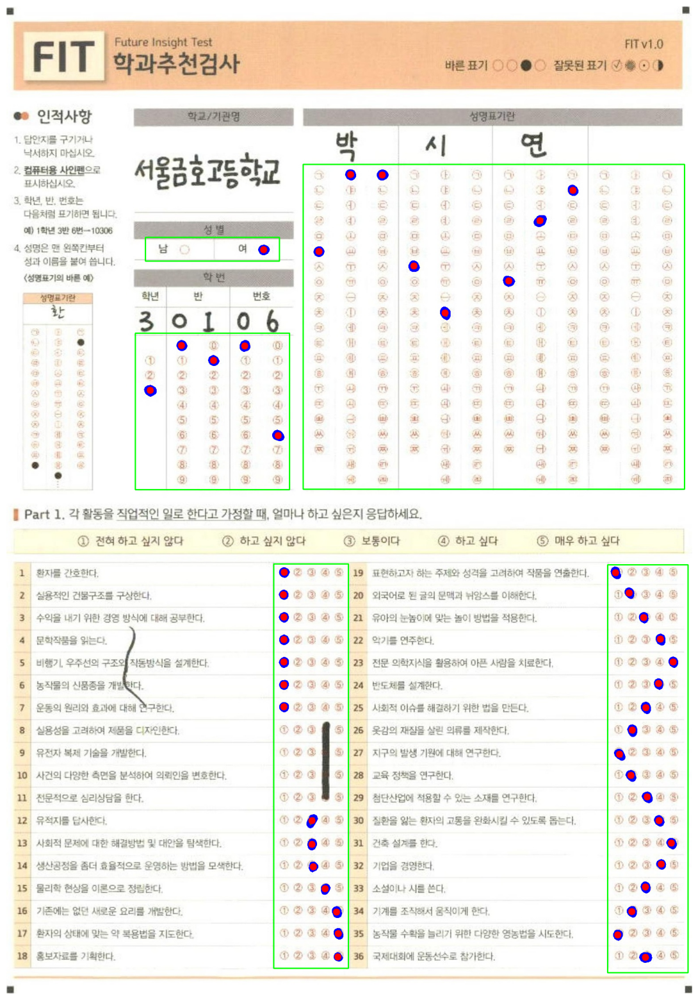

FIT_2.jpg


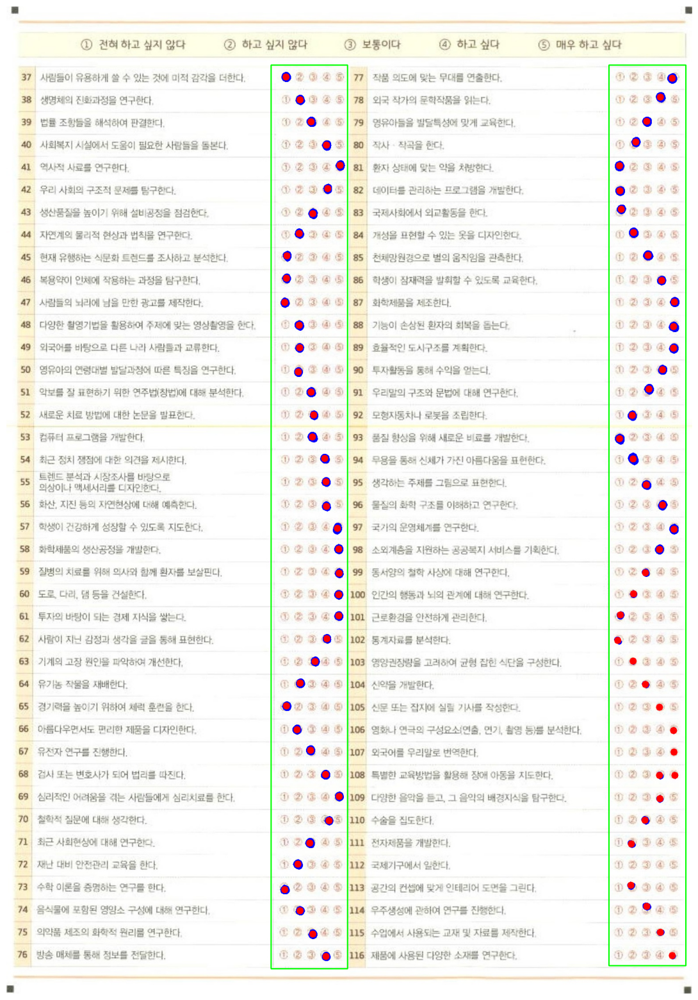

FIT_3.jpg


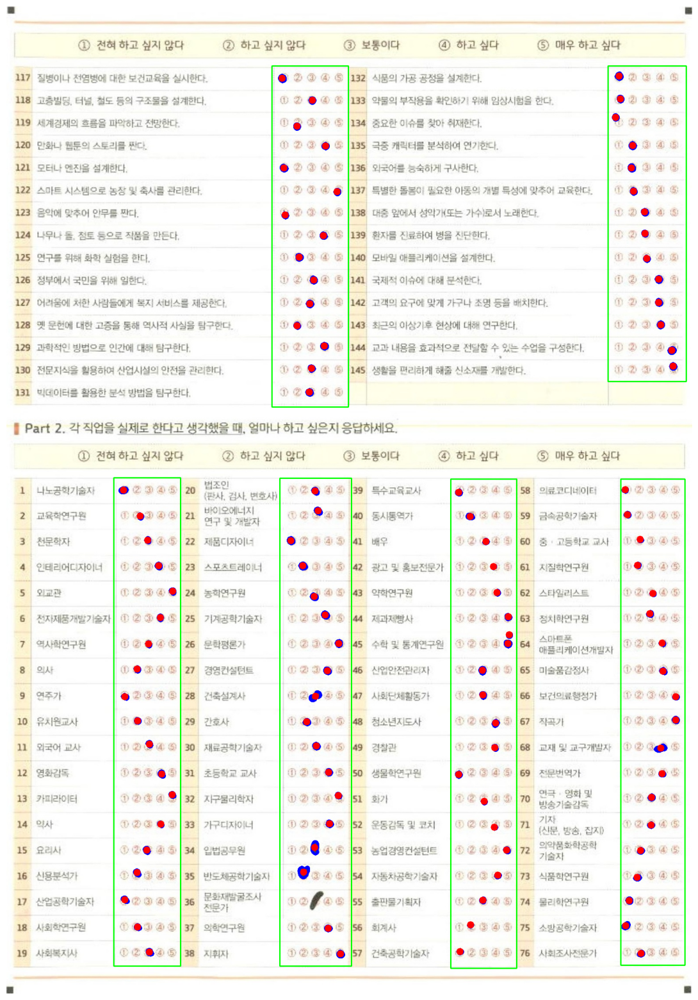

FIT_4.jpg


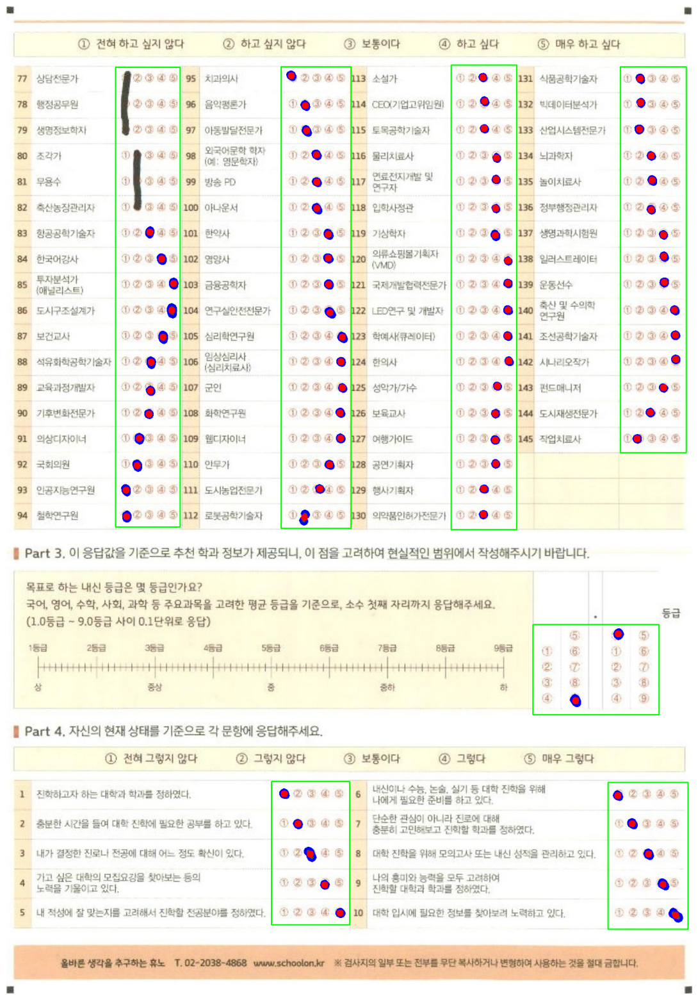

In [478]:
def is_in_circle(shifted_cnt, project_name, page, wh_ratio, where_in_real_circle_dict):
    (x, y), radius = cv2.minEnclosingCircle(shifted_cnt)
    r = int(radius)//2
    page = int(page)
    
    # 원의 경계 좌표
    circle_left = x - r
    circle_top = y - r
    circle_right = x + r
    circle_bottom = y + r

    # 원이 사각형 내부에 완전히 포함되는지 확인
    pass_point = False
    for rdx, rect_point in enumerate(wh_ratio):
        sector = rdx+1
        left, top, right, bottom, t, part = rect_point
        if (circle_left >= left and
            circle_top >= top and
            circle_right <= right and
            circle_bottom <= bottom):
            pass_point = True
            if project_name not in where_in_real_circle_dict:
                where_in_real_circle_dict[project_name] = {}
            if page not in where_in_real_circle_dict[project_name]:
                where_in_real_circle_dict[project_name][page] = {}
            if sector not in where_in_real_circle_dict[project_name][page]:
                where_in_real_circle_dict[project_name][page][sector] = []
                
            where_in_real_circle_dict[project_name][page][sector].append([x, y, radius, shifted_cnt, t, part])
            break
    
    if not pass_point:
        return False
    
    return True

def find_contour(image):
    # 그레이스케일 변환
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # 블러링을 통해 노이즈 제거
    blurred = cv2.GaussianBlur(gray, (9, 9), 0)

    # 바이너리 스레시홀딩
    _, binary = cv2.threshold(blurred, 150, 255, cv2.THRESH_BINARY_INV)

    # 외곽선 찾기
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    return contours


# origin_image_list = [f"{project_name}_{i}.jpg" for i in range(1,5)]
where_in_real_circle_dict = dict()
page_ratio_dict = dict()
for idx, (image, origin_image) in enumerate(zip(real_image_list, circle_image_list)):
    print(origin_image)
    page = idx+1
    image = cv2.imread(image)
    origin_image = cv2.imread(f'./scan/datas/pdf/circles/tem/{origin_image}')
    # origin_image = cv2.imread(f'./scan/datas/pdf/chk/test/{project_name}/000{page}_resized.jpg')

    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    lower_red1 = np.array([0, 150, 150])
    upper_red1 = np.array([10, 255, 255])
    lower_red2 = np.array([170, 150, 150])
    upper_red2 = np.array([180, 255, 255])
    mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
    mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
    mask = cv2.bitwise_or(mask1, mask2)
    image[mask > 0] = [255, 255, 255]
    
    contours = find_contour(image)

    # 색칠된 동그라미만 남기기 위해 필터링
    filtered_contours = [cnt for cnt in contours if (cv2.contourArea(cnt) > 10) and (cv2.contourArea(cnt) < 500)]

    height, width = image.shape[:2]
    origin_height, origin_width = origin_image.shape[:2]

    x_ratio_re = width / origin_width
    y_ratio_re = height/ origin_height
    x_ratio = origin_width / width
    y_ratio = origin_height/ height
    
    page_ratio_dict[page] = [x_ratio, y_ratio, x_ratio_re, y_ratio_re]
    wh_ratio = [[int(x * x_ratio_re), int(y * y_ratio_re), int(xw * x_ratio_re), int(yh * y_ratio_re), t, part] 
                for (x, y, xw, yh, t, part, start) in rects_point_dict[project_name][page]]
    
    shifted_contours = []
    for cnt in filtered_contours:
        shifted_cnt = np.array(cnt)
        if is_in_circle(shifted_cnt, project_name, page, wh_ratio, where_in_real_circle_dict):
            shifted_contours.append(shifted_cnt)
        
    # 원본 이미지에 외곽선 그리기
    output_image = image.copy()
    cv2.drawContours(output_image, shifted_contours, -1, (255, 0, 0), 5)

    for cnt in shifted_contours:
        M = cv2.moments(cnt)
        if M["m00"] != 0:
            cX = int(M["m10"] // M["m00"])
            cY = int(M["m01"] // M["m00"])
            cv2.circle(output_image, (cX, cY), 8, (0, 0, 255), -1)  # 중심에 빨간색 점 그리기

    # 결과 이미지 보기
    wh_rect = [wh[:-2] for wh in wh_ratio]
    for x,y,xw,yh in wh_rect:
        start_point = (x,y)
        end_point = (xw,yh)
        color = (0, 255, 0)  # 사각형 색상 (B, G, R) 형식
        thickness = 2  # 사각형 선 두께
        cv2.rectangle(output_image, start_point, end_point, color, thickness)

    plt.figure(figsize=(20, 20))
    plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
    output_image = cv2.resize(output_image, (836, 1176), interpolation=cv2.INTER_AREA)
    # cv2.imwrite(f'./scan/datas/PU/result/page{page}.jpg', output_image)
    # (f'./scan/datas/pdf/chk/test/{project_name}/000{page}_resized.jpg')
    cv2.imwrite(f'./scan/datas/pdf/chk/test/{project_name}/result/000{page}_resized.jpg', output_image)
    
where_in_real_circle_dict = {k: v for k, v in sorted(where_in_real_circle_dict.items())}
where_in_real_circle_dict = {k: {sk: sv for sk, sv in sorted(v.items())} for k, v in where_in_real_circle_dict.items()}
where_in_real_circle_dict = {k: {sk: {ssk: ssv for ssk, ssv in sorted(sv.items())} for sk, sv in v.items()} for k, v in where_in_real_circle_dict.items()}

In [479]:
def find_choice_xy(p_s, s_df, a_c_df, m_df):
    page, sector = p_s
    type_list = s_df['type'].values[0]
    type_, select_cnt = type_list[0], type_list[1:]
    if type_ == 0:                                      # 가로형
        for_q = 'y'
        for_c = 'x'
    # if type_ == 1:                                      # 세로형
    if type_ in [1,3,4]:              # 세로형 이름형 숫자결합형
        for_q = 'x'
        for_c = 'y'
    if type_ == 5: # 가로-혼합형
        for_q = 'y'
        for_c = 'x'
    if type_ == 6: # 세로-혼합형
        for_q = 'x'
        for_c = 'y'
    page_sec_df = a_c_df.loc[(a_c_df['page'] == page) & (a_c_df['sector'] == sector)]
    
    if (type_ in [0,1]) and (select_cnt != []):
        sorted_s_df = s_df.sort_values(by=for_c)  
    else:
        sorted_s_df = s_df.sort_values(by=for_q)  
    
    for rdx, row in sorted_s_df.iterrows():
        row = pd.DataFrame(row).transpose()
        if (type_ in [0,1]) and (select_cnt != []):
            row['question_num'] = row[for_c].apply(lambda l : page_sec_df.loc[(page_sec_df[for_c] - l).abs().idxmin(), 'question_num'])
        else:
            row['question_num'] = row[for_q].apply(lambda l : page_sec_df.loc[(page_sec_df[for_q] - l).abs().idxmin(), 'question_num'])
        page_sec_df_question_num = page_sec_df.loc[page_sec_df['question_num'] == row['question_num'].values[0]]
        
        gap = 10
        if (type_ in [0,1]) and (select_cnt != []):
            page_sec_df_gap = page_sec_df_question_num.loc[abs(page_sec_df_question_num[for_c] - row[for_c].values[0]) < gap]
        else:
            page_sec_df_gap = page_sec_df_question_num.loc[abs(page_sec_df_question_num[for_q] - row[for_q].values[0]) < gap]
        len_page_sec_df_gap = len(page_sec_df_gap)
        while not len_page_sec_df_gap:
            gap += 5
            if (type_ in [0,1]) and (select_cnt != []):
                page_sec_df_gap = page_sec_df.loc[abs(page_sec_df[for_c] - row[for_c].values[0]) < gap]
            else:
                page_sec_df_gap = page_sec_df.loc[abs(page_sec_df[for_q] - row[for_q].values[0]) < gap]
            len_page_sec_df_gap = len(page_sec_df_gap)
        row['type'] = type_
        page_sec_df_where_mark = page_sec_df_gap.copy()
        if (type_ in [0,1]) and (select_cnt != []):
            row['choices_count'] = row[for_q].apply(lambda l : page_sec_df_where_mark.loc[(page_sec_df_where_mark[for_q] - l).abs().idxmin(), 'choices_count'])
        else:
            row['choices_count'] = row[for_c].apply(lambda l : page_sec_df_where_mark.loc[(page_sec_df_where_mark[for_c] - l).abs().idxmin(), 'choices_count'])
        
        m_df = pd.concat([m_df, row], axis = 0).reset_index(drop = True)

    return m_df


In [480]:
dot_dict = dict()
all_circle_df = pd.DataFrame(project_dict[project_name])
print(project_name)
for project_name, pages_dict in where_in_real_circle_dict.items():
    project_df = pd.DataFrame()
    for page, sector_dict in pages_dict.items():
        page_df = pd.DataFrame()
        x_ratio, y_ratio = page_ratio_dict[page][:2]
        for sector, circle_list in sector_dict.items():
            ratio_circle_list = [[int(x * x_ratio), int(y * y_ratio), int(r), cnt*(x_ratio, y_ratio), t, part] for (x, y, r, cnt, t, part) in circle_list]
            where_in_real_circle_dict[project_name][page][sector] = ratio_circle_list
            df = pd.DataFrame(ratio_circle_list, columns=['x', 'y', 'r', 'cnt', 'type', 'part'])
            df['page'] = page
            df['sector'] = sector
            df = df[['x', 'y', 'r', 'cnt', 'page', 'sector', 'type', 'part']]
            page_df = pd.concat([page_df, df], axis = 0).reset_index(drop=True)
        project_df = pd.concat([project_df, page_df], axis = 0).reset_index(drop=True)
        
    marking_df = pd.DataFrame()
    for idx, small_df in project_df.groupby(['page', 'sector']):
        marking_df = find_choice_xy(idx, small_df, all_circle_df, marking_df)
        # find_choice_xy(idx, small_df, all_circle_df)

FIT


---

In [481]:
marking_df

,x,y,r,cnt,page,sector,type,part,question_num,choices_count
0,585,553,10,"[[[584.0, 545.0]], [[583.0, 546.0]], [[580.0, ...",1,1,0,gender,1,2
1,327,873,11,"[[[326.0, 864.0]], [[325.0, 865.0]], [[321.0, ...",1,2,4,number,1,3
2,399,771,9,"[[[396.0, 762.0]], [[395.0, 763.0]], [[394.0, ...",1,2,4,number,2,1
3,471,804,9,"[[[469.0, 796.0]], [[468.0, 797.0]], [[467.0, ...",1,2,4,number,3,2
4,542,772,10,"[[[541.0, 762.0]], [[540.0, 763.0]], [[539.0, ...",1,2,4,number,4,1
...,...,...,...,...,...,...,...,...,...,...
301,1392,1795,9,"[[[1389.0, 1786.0]], [[1388.0, 1787.0]], [[138...",4,7,0,part4,1,1
302,1424,1860,10,"[[[1421.0, 1850.0]], [[1420.0, 1851.0]], [[141...",4,7,0,part4,2,2
303,1461,1929,10,"[[[1459.0, 1919.0]], [[1458.0, 1920.0]], [[145...",4,7,0,part4,3,3
304,1495,1997,12,"[[[1490.0, 1987.0]], [[1489.0, 1988.0]], [[148...",4,7,0,part4,4,4


In [482]:
marking_df = marking_df.merge(all_circle_df, how = 'inner', on = ['page', 'sector', 'type', 'question_num', 'choices_count', 'part'])
marking_df.columns = ['x', 'y', 'r', 'cnt', 'page', 'sector', 'type', 'part','question_num', 'choices_count', 'circle_x', 'circle_y', 'circle_r', 'start', 'real_num']
marking_df = marking_df[['x', 'y', 'r', 'cnt', 'page', 'sector', 'type', 'part','question_num', 'choices_count', 'start', 'real_num', 'circle_x', 'circle_y', 'circle_r']]
marking_df

,x,y,r,cnt,page,sector,type,part,question_num,choices_count,start,real_num,circle_x,circle_y,circle_r
0,585,553,10,"[[[584.0, 545.0]], [[583.0, 546.0]], [[580.0, ...",1,1,0,gender,1,2,[남],여,586,552,11
1,327,873,11,"[[[326.0, 864.0]], [[325.0, 865.0]], [[321.0, ...",1,2,4,number,1,3,"[1, 0, 0, 0, 0]",3,326,872,11
2,399,771,9,"[[[396.0, 762.0]], [[395.0, 763.0]], [[394.0, ...",1,2,4,number,2,1,"[1, 0, 0, 0, 0]",0,398,770,11
3,471,804,9,"[[[469.0, 796.0]], [[468.0, 797.0]], [[467.0, ...",1,2,4,number,3,2,"[1, 0, 0, 0, 0]",1,472,804,11
4,542,772,10,"[[[541.0, 762.0]], [[540.0, 763.0]], [[539.0, ...",1,2,4,number,4,1,"[1, 0, 0, 0, 0]",0,544,770,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301,1392,1795,9,"[[[1389.0, 1786.0]], [[1388.0, 1787.0]], [[138...",4,7,0,part4,1,1,[1],1,1394,1792,11
302,1424,1860,10,"[[[1421.0, 1850.0]], [[1420.0, 1851.0]], [[141...",4,7,0,part4,2,2,[1],2,1426,1858,10
303,1461,1929,10,"[[[1459.0, 1919.0]], [[1458.0, 1920.0]], [[145...",4,7,0,part4,3,3,[1],3,1458,1926,10
304,1495,1997,12,"[[[1490.0, 1987.0]], [[1489.0, 1988.0]], [[148...",4,7,0,part4,4,4,[1],4,1490,1994,10


In [483]:
image_width = 100
image_height = 100
image_size = (image_height, image_width)
intersection_list = []

if 'intersection_ratio' in marking_df.columns:
    del marking_df['intersection_ratio']

for rdx, row in marking_df.iterrows():
    x, y, r, contour, page, sector, type, part, start, real_num, question_num, choices_count, circle_x, circle_y, circle_r = row.values
    # contour = contour.astype(int)
    contour = np.round(contour).astype(int)
    
    circle_img = np.zeros(image_size, np.uint8)
    contour_img = np.zeros(image_size, np.uint8)

    # 좌표를 이미지 내부로 변환
    adjusted_x = circle_x - (circle_x - 50)
    adjusted_y = circle_y - (circle_y - 50)

    # 원 그리기
    cv2.circle(circle_img, (adjusted_x, adjusted_y), circle_r, 255, -1)

    # 윤곽선 좌표 조정
    adjusted_contour = contour - [circle_x - 50, circle_y - 50]

    # 윤곽선 내부 채우기
    cv2.drawContours(contour_img, [adjusted_contour], -1, 255, -1)
    # plt.figure(figsize=(15, 15))
    # plt.imshow(cv2.cvtColor(contour_img, cv2.COLOR_BGR2RGB))
    # plt.axis('off')
    # plt.show()
    # 두 이미지를 AND 연산하여 교집합 영역 찾기
    intersection = cv2.bitwise_and(circle_img, contour_img)

    # 교집합 영역의 픽셀 수 계산
    intersection_area = np.sum(intersection == 255)

    # 원의 영역 계산
    circle_area = np.sum(circle_img == 255)

    # 교집합 비율 계산
    intersection_ratio = intersection_area / circle_area

    # print(f"교집합 비율: {intersection_ratio:.4f}")
    
    # if intersection_ratio > 0.6:
    #     pass_intersection_list.append(rdx)
# real_sorted_df = real_sorted_df.iloc[pass_intersection_list, :].reset_index(drop = True)

    intersection_list.append(intersection_ratio)
marking_df['intersection_ratio'] = intersection_list
marking_df

,x,y,r,cnt,page,sector,type,part,question_num,choices_count,start,real_num,circle_x,circle_y,circle_r,intersection_ratio
0,585,553,10,"[[[584.0, 545.0]], [[583.0, 546.0]], [[580.0, ...",1,1,0,gender,1,2,[남],여,586,552,11,0.753316
1,327,873,11,"[[[326.0, 864.0]], [[325.0, 865.0]], [[321.0, ...",1,2,4,number,1,3,"[1, 0, 0, 0, 0]",3,326,872,11,0.835544
2,399,771,9,"[[[396.0, 762.0]], [[395.0, 763.0]], [[394.0, ...",1,2,4,number,2,1,"[1, 0, 0, 0, 0]",0,398,770,11,0.745358
3,471,804,9,"[[[469.0, 796.0]], [[468.0, 797.0]], [[467.0, ...",1,2,4,number,3,2,"[1, 0, 0, 0, 0]",1,472,804,11,0.755968
4,542,772,10,"[[[541.0, 762.0]], [[540.0, 763.0]], [[539.0, ...",1,2,4,number,4,1,"[1, 0, 0, 0, 0]",0,544,770,11,0.753316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301,1392,1795,9,"[[[1389.0, 1786.0]], [[1388.0, 1787.0]], [[138...",4,7,0,part4,1,1,[1],1,1394,1792,11,0.575597
302,1424,1860,10,"[[[1421.0, 1850.0]], [[1420.0, 1851.0]], [[141...",4,7,0,part4,2,2,[1],2,1426,1858,10,0.791798
303,1461,1929,10,"[[[1459.0, 1919.0]], [[1458.0, 1920.0]], [[145...",4,7,0,part4,3,3,[1],3,1458,1926,10,0.665615
304,1495,1997,12,"[[[1490.0, 1987.0]], [[1489.0, 1988.0]], [[148...",4,7,0,part4,4,4,[1],4,1490,1994,10,0.659306


In [489]:
p = 1
s = 3

# display(marking_df.loc[(marking_df['page'] == p) & (marking_df['sector'] == s) & (marking_df['intersection_ratio'] >= 0.4)])
display(marking_df.loc[(marking_df['page'] == p) & (marking_df['sector'] == s)])
print()
# display(all_circle_df.loc[(all_circle_df['page'] == p) & (all_circle_df['sector'] == s)])

,x,y,r,cnt,page,sector,type,part,question_num,choices_count,start,real_num,circle_x,circle_y,circle_r,intersection_ratio
6,710,557,9,"[[[708.0, 549.0]], [[707.0, 550.0]], [[706.0, ...",1,3,3,name,1,6,[],ㅂ,710,556,11,0.726790
7,783,382,10,"[[[782.0, 373.0]], [[781.0, 374.0]], [[778.0, ...",1,3,3,name,2,1,[],ㅏ,784,384,11,0.763926
8,855,383,10,"[[[853.0, 374.0]], [[852.0, 375.0]], [[850.0, ...",1,3,3,name,3,1,[],ㄱ,856,382,11,0.832891
9,927,590,10,"[[[923.0, 581.0]], [[920.0, 584.0]], [[920.0, ...",1,3,3,name,4,7,[],ㅅ,928,592,11,0.822281
10,998,698,12,"[[[994.0, 686.0]], [[991.0, 689.0]], [[991.0, ...",1,3,3,name,5,10,[],ㅣ,1000,696,11,0.819629
11,1143,623,10,"[[[1136.0, 616.0]], [[1134.0, 618.0]], [[1134....",1,3,3,name,7,8,[],ㅇ,1146,626,11,0.721485
12,1214,487,13,"[[[1212.0, 478.0]], [[1211.0, 479.0]], [[1210....",1,3,3,name,8,4,[],ㅕ,1218,488,11,0.816976
13,1289,418,10,"[[[1288.0, 408.0]], [[1287.0, 409.0]], [[1284....",1,3,3,name,9,2,[],ㄴ,1290,418,11,0.750663


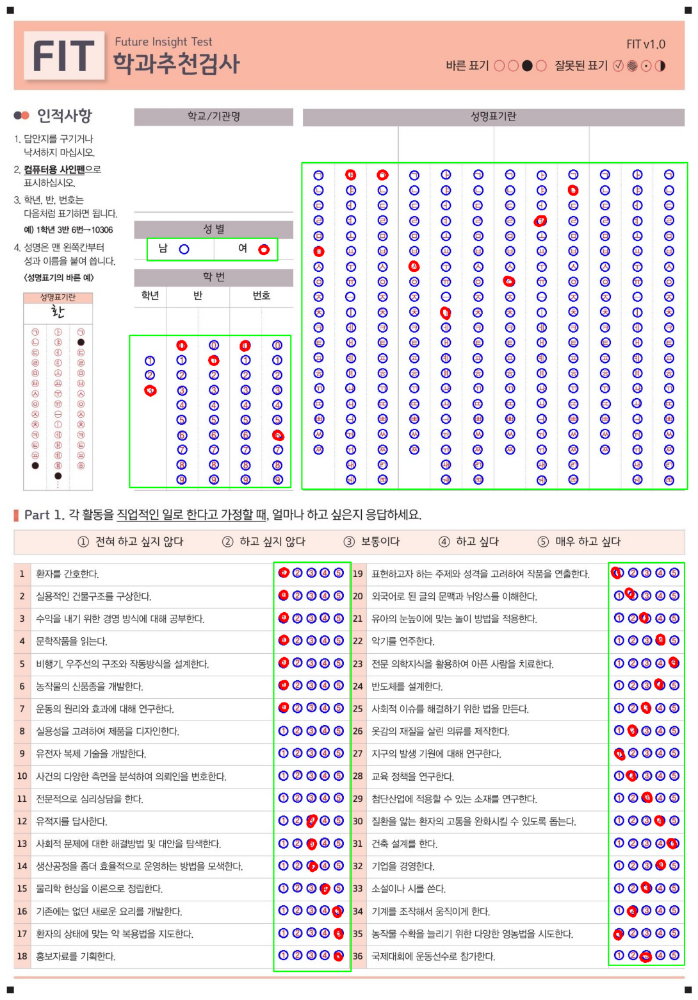

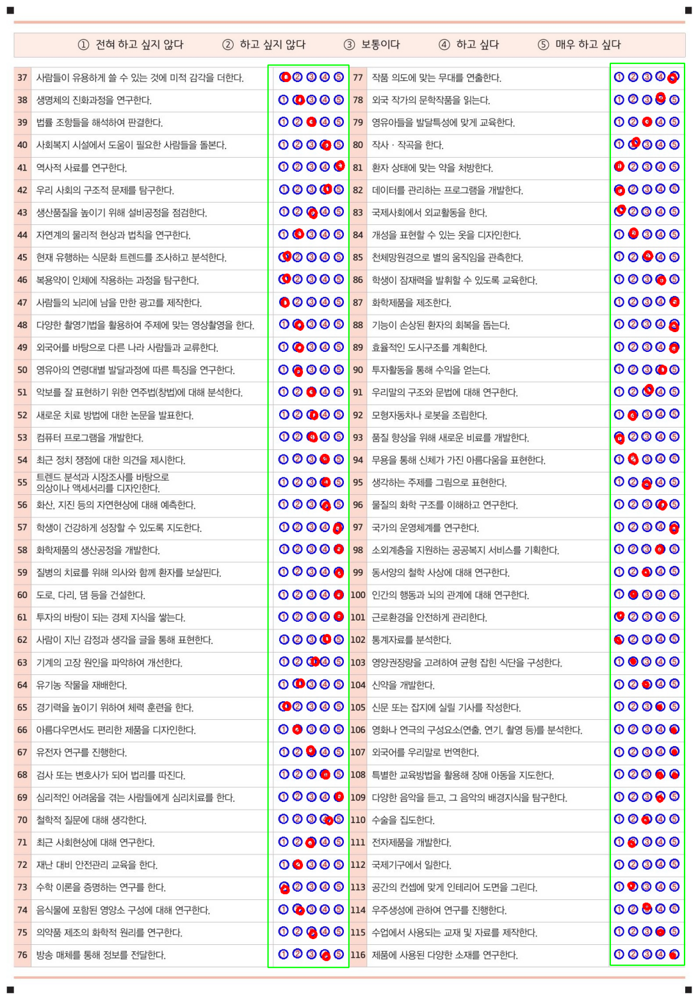

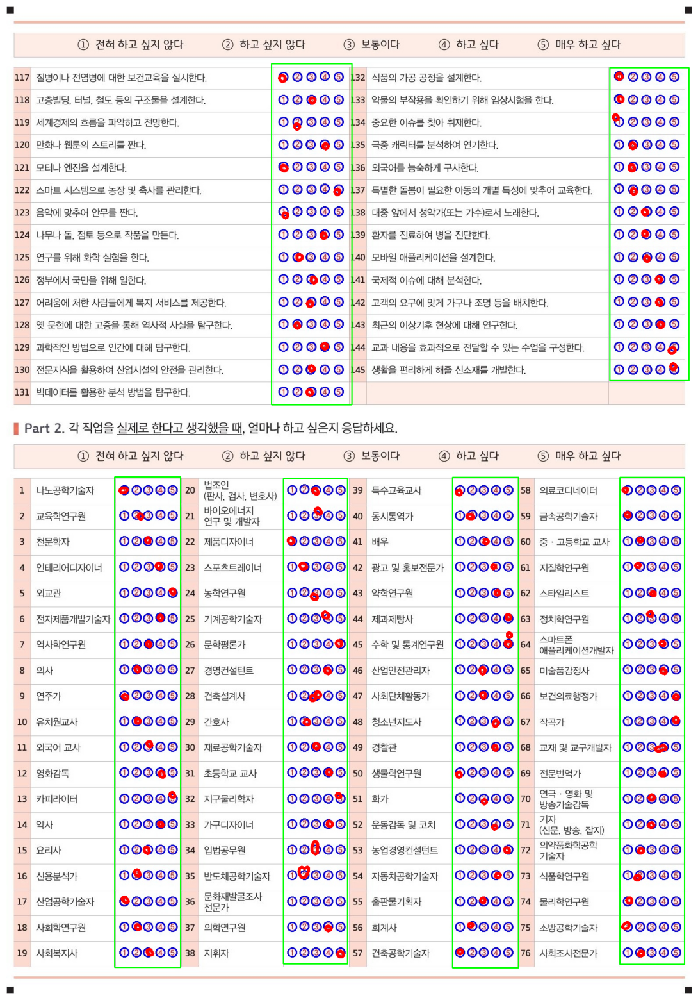

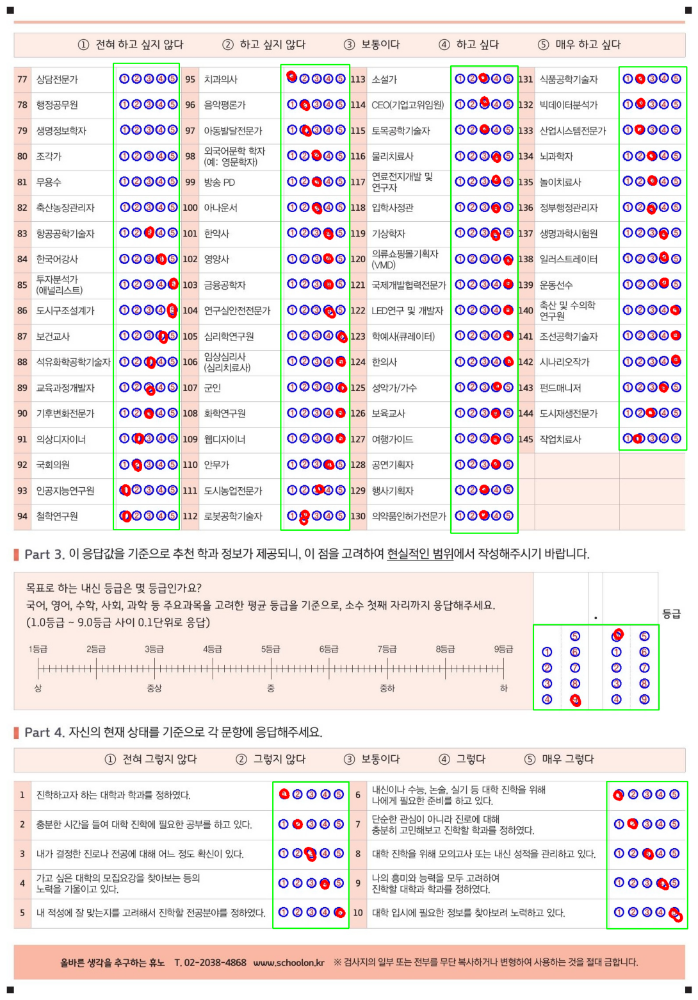

In [470]:
for page, origin_image in enumerate(circle_image_list):
    page = page+1
    origin_image = cv2.imread(f'./scan/datas/pdf/circles/tem/{origin_image}')
    page_df = marking_df.loc[marking_df['page'] == page]
    # real_dots = page_df.loc[page_df['intersection_ratio'] >= 0.4, ['x','y', 'cnt']] # pdf버전:0.5 / jpg버전:0.4
    real_dots = page_df.loc[:, ['x','y', 'cnt']]
    r = real_dots
    real_dots = [v[:2] for v in real_dots.values]
    real_cnt = r['cnt'].apply(lambda x : x.astype(int)).values
    
    # real_contour = [v[-1] for v in real_dots.values]
    
    img = origin_image.copy()
    # for cnt in real_dots:
    #     cv2.circle(img, cnt, 10, (0, 0, 255), -1)  # 중심에 빨간색 점 그리기

    cv2.drawContours(img, real_cnt, -1, (0, 0, 255), 5)

    for x,y,xw,yh,t,part,start in rects_point_dict[project_name][page]:
        start_point = (x,y)
        end_point = (xw,yh)
        color = (0, 255, 0)
        thickness = 2
        cv2.rectangle(img, start_point, end_point, color, thickness)
    
    plt.figure(figsize=(20, 20))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

In [ ]:
marking_df.loc[(marking_df['page'] == 2) & (marking_df['sector'] == 4)]

In [ ]:
marking_df.loc[(marking_df['page'] == 2) & (marking_df['sector'] == 4)]

In [ ]:
marking_df